In [45]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import model_selection
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler

In [46]:
# Ссылка на датасет
url = 'https://raw.githubusercontent.com/injchernomor/ml-libraries-project/refs/heads/dev/data-source/data/output1.csv'
df = pd.read_csv(url)
df.head()

,encrypted_word,encryption_algorithm
0,04145628c4a8befbf5579768482fef4b57efed15030099...,sha256
1,ab46aeaba95f702e57694d410fe770068c1850c941741d...,sha256
2,42c241043c6cd86fdf1026a96f0090c56607e7cdc3ba09...,sha256
3,eb128f5be03565e1ae9d494ff1b7a2b8c33d4737c435de...,sha256
4,eb5b3162f1545adb0b9c3be4199d338c621242214edc88...,sha256


In [47]:
def extract_features(encrypted_value):
    encrypted_value = str(encrypted_value)
    a = encrypted_value.count('a')
    b = encrypted_value.count('b')
    c = encrypted_value.count('c')
    d = encrypted_value.count('d')
    e = encrypted_value.count('e')
    f = encrypted_value.count('f')
    g = encrypted_value.count('g')
    h = encrypted_value.count('h')
    i = encrypted_value.count('i')
    j = encrypted_value.count('j')
    k = encrypted_value.count('k')
    l = encrypted_value.count('l')
    m = encrypted_value.count('m')
    n = encrypted_value.count('n')
    o = encrypted_value.count('o')
    p = encrypted_value.count('p')
    q = encrypted_value.count('q')
    r = encrypted_value.count('r')
    s = encrypted_value.count('s')
    t = encrypted_value.count('t')
    u = encrypted_value.count('u')
    v = encrypted_value.count('v')
    w = encrypted_value.count('w')
    x = encrypted_value.count('x')
    y = encrypted_value.count('y')
    z = encrypted_value.count('z')
    zero = encrypted_value.count('0')
    one= encrypted_value.count('1')
    two= encrypted_value.count('2')
    free= encrypted_value.count('3')
    four= encrypted_value.count('4')
    fife= encrypted_value.count('5')
    six= encrypted_value.count('6')
    seven= encrypted_value.count('7')
    eight= encrypted_value.count('8')
    nine= encrypted_value.count('9')
    ten= encrypted_value.count('10')
    return [a, b, c, d, e, f, g, h, i, j, k, l, m, n, o, p, q, r, s, t, u, v, w, x, y, z,zero,one,two,free,four,fife,six,seven,eight,nine,ten
]


In [48]:
# Применяем функцию извлечения характеристик ко всем данным
features = np.array([extract_features(value) for value in df['encrypted_word']])
#np.set_printoptions(threshold=np.inf)
features

array([[ 1,  3,  5,  1,  5,  7,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  8,  2,  3,  1,  6,  6,
         3,  5,  5,  3,  0],
       [ 6,  2,  3,  2,  3,  4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  6,  5,  3,  0,  9,  4,
         5,  6,  3,  3,  1],
       [ 4,  1,  7,  6,  1,  4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  8,  3,  3,  2,  6,  2,
         7,  2,  3,  5,  2],
       [ 2,  6,  2,  5,  7,  7,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  3,  4,  5,  4,  4,
         3,  4,  3,  2,  0],
       [ 2,  7,  4,  4,  4,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  7,  8,  4,  5,  3,
         3,  1,  3,  4,  1],
       [ 4,  5,  7,  4,  3,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  4,  1,  7,

In [49]:
correlation_matrix = np.corrcoef(features, rowvar=False)
print(correlation_matrix)

[[1.         0.21129313 0.2160702  0.21294903 0.20926836 0.21719747
         nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan 0.20853932 0.21019478 0.21172872 0.21235828
  0.21358658 0.2132398  0.21199428 0.21449993 0.20817205 0.21617529
  0.04410332]
 [0.21129313 1.         0.21972601 0.21019892 0.21823152 0.2143442
         nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan 0.20813343 0.20916483 0.20927885 0.21027309
  0.21224614 0.21532711 0.2159432  0.20952849 0.21137788 0.2134368
  0.04441611]
 [0.2160702  0.21972601 1.         0.2111089  0.20934606 0.21202591
         nan        nan        nan        nan        nan        nan
         nan        na

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [36]:
columns = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
print("Матрица корреляции:")
print(" " * 10, end='')  # Отступ перед заголовками
for col in columns:
    print(f"{col:>15}", end=' ')  # Печатаем заголовки с отступами
print()
for i, row in enumerate(correlation_matrix):
    print(f"{columns[i]:>10} ", end='')  # Заголовок для строки
    for value in row:
        print(f"{value:15.2f}", end=' ')  # Печатаем значения с форматированием
    print()  # Переход на новую строку

Матрица корреляции:
                        a               b               c               d               e               f               g               h               i               j               k               l               m               n               o               p               q               r               s               t               u               v               w               x               y               z               0               1               2               3               4               5               6               7               8               9              10 
         a            1.00            0.21            0.22            0.21            0.21            0.22             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             nan             na

In [50]:
means = np.where(features.mean(axis=0) == 0, 0, features.mean(axis=0))  # Чтобы избежать деления на ноль
data_filled = np.where(features == 0, means, features)

# Вычисляем матрицу корреляции
correlation_matrix_null = np.nan_to_num(correlation_matrix)
correlation_matrix_null

array([[1.        , 0.21129313, 0.2160702 , 0.21294903, 0.20926836,
        0.21719747, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.20853932, 0.21019478, 0.21172872, 0.21235828,
        0.21358658, 0.2132398 , 0.21199428, 0.21449993, 0.20817205,
        0.21617529, 0.04410332],
       [0.21129313, 1.        , 0.21972601, 0.21019892, 0.21823152,
        0.2143442 , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.20813343, 0.20916483, 0.20927885, 0.21027309,
        0.21224614, 0.21532711, 0.2159432 , 0.20952849, 0.21137788,
        0.21343

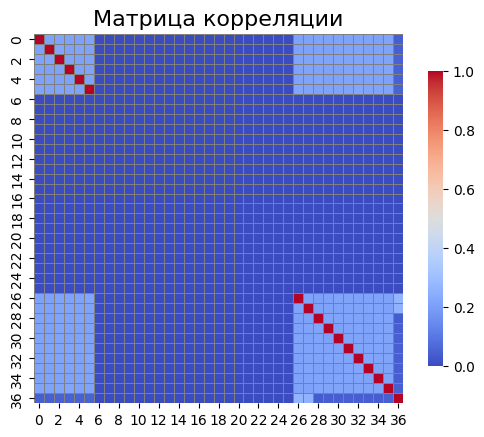

In [51]:
# Создаем тепловую карту с аннотированными значениями и кастомизированной цветовой палитрой
sns.heatmap(correlation_matrix_null,
            annot=False,  # Можно убрать аннотацию для больших матриц
            cmap='coolwarm',
            square=True,
            cbar_kws={"shrink": .8},
            linewidths=0.5,
            linecolor='gray')

# Настраиваем заголовок
plt.title('Матрица корреляции', fontsize=16)
plt.show()

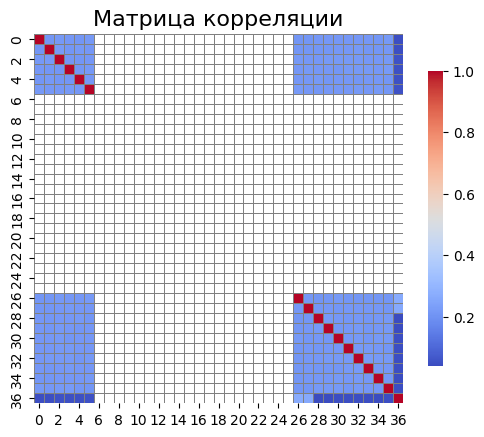

In [17]:
# Создаем тепловую карту с аннотированными значениями и кастомизированной цветовой палитрой
sns.heatmap(correlation_matrix,
            annot=False,  # Можно убрать аннотацию для больших матриц
            cmap='coolwarm',
            square=True,
            cbar_kws={"shrink": .8},
            linewidths=0.5,
            linecolor='gray')

# Настраиваем заголовок
plt.title('Матрица корреляции', fontsize=16)
plt.show()

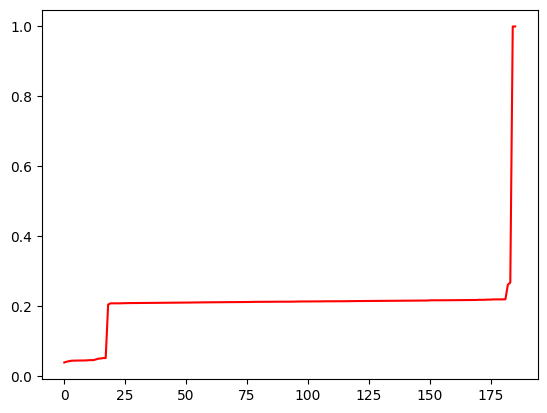

In [26]:
plt.plot (np.unique(correlation_matrix), color = 'red')

In [5]:
df1 = pd.DataFrame(features)
df1

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,1,3,5,1,5,7,0,0,0,0,...,2,3,1,6,6,3,5,5,3,0
1,6,2,3,2,3,4,0,0,0,0,...,5,3,0,9,4,5,6,3,3,1
2,4,1,7,6,1,4,0,0,0,0,...,3,3,2,6,2,7,2,3,5,2
3,2,6,2,5,7,7,0,0,0,0,...,3,4,5,4,4,3,4,3,2,0
4,2,7,4,4,4,1,0,0,0,0,...,7,8,4,5,3,3,1,3,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84101,3,3,1,2,1,3,0,0,0,0,...,2,1,1,2,2,1,2,2,3,0
84102,3,2,3,0,2,1,0,0,0,0,...,2,1,3,0,1,3,4,3,2,0
84103,2,0,3,2,1,3,0,0,0,0,...,1,2,2,1,3,0,2,3,5,0
84104,2,1,3,3,0,3,0,0,0,0,...,1,3,1,2,1,3,4,1,2,0


In [7]:
df1 = pd.DataFrame(features)
correlation_matrix = df1.corr()
print(correlation_matrix)

          0         1         2         3         4         5   6   7   8   \
0   1.000000  0.211293  0.216070  0.212949  0.209268  0.217197 NaN NaN NaN   
1   0.211293  1.000000  0.219726  0.210199  0.218232  0.214344 NaN NaN NaN   
2   0.216070  0.219726  1.000000  0.211109  0.209346  0.212026 NaN NaN NaN   
3   0.212949  0.210199  0.211109  1.000000  0.210834  0.217420 NaN NaN NaN   
4   0.209268  0.218232  0.209346  0.210834  1.000000  0.212433 NaN NaN NaN   
5   0.217197  0.214344  0.212026  0.217420  0.212433  1.000000 NaN NaN NaN   
6        NaN       NaN       NaN       NaN       NaN       NaN NaN NaN NaN   
7        NaN       NaN       NaN       NaN       NaN       NaN NaN NaN NaN   
8        NaN       NaN       NaN       NaN       NaN       NaN NaN NaN NaN   
9        NaN       NaN       NaN       NaN       NaN       NaN NaN NaN NaN   
10       NaN       NaN       NaN       NaN       NaN       NaN NaN NaN NaN   
11       NaN       NaN       NaN       NaN       NaN       NaN N

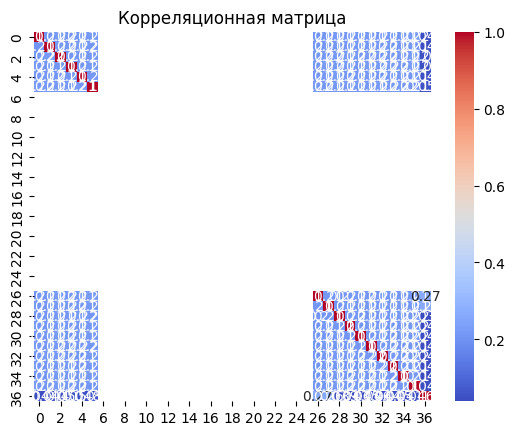

In [8]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()